In [1]:
import sparkle
import time
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import bagpy
from bagpy import bagreader
from strym import strymread

Loading BokehJS ...

In [17]:
bagfiles_collected = []
folder = '/home/refulgent/Cyverse/sparkle/'
## these after correcting leadervel publishing
# bagfiles_collected.append(folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-00-12-13.bag')
# bagfiles_collected.append(folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-00-32-24.bag')
# bagfiles_collected.append(folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-00-52-25.bag')

bagfiles_collected.append(folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-08-33-55.bag')
bagfiles_collected.append(folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-09-11-33.bag')
bagfiles_collected.append(folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-09-32-41.bag')
bagfiles_collected.append(folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-10-00-27.bag')

In [18]:
cmd_speed =[]
speed = []
posX = []
lead_dist = []
rel_vel = []

for bf in bagfiles_collected:
    B = bagreader(bf)
    
    cmd_speed_b = []
    speed_b = []
    odom_b = []
    lead_dist_b = []
    relvel_b = []
    for i in range(0, 24):
            print(i)
            cmdvel_file = B.message_by_topic('/sparkle_{:03d}/cmd_vel'.format(i))
            cmdvel = pd.read_csv(cmdvel_file)
            cmd_speed_b.append(cmdvel)
            
            vel_file = B.message_by_topic('/sparkle_{:03d}/vel'.format(i))
            vel = pd.read_csv(vel_file)
            speed_b.append(vel)
            
            odom_file = B.message_by_topic('/sparkle_{:03d}/odom'.format(i))
            odom = pd.read_csv(odom_file)
            odom_b.append(odom)
            
            lead_dist_file = B.message_by_topic('/sparkle_{:03d}/lead_dist'.format(i))
            lead_distance = pd.read_csv(lead_dist_file)
            lead_dist_b.append(lead_distance)
            
            relvel_file = B.message_by_topic('/sparkle_{:03d}/rel_vel'.format(i))
            relvel = pd.read_csv(relvel_file)
            relvel_b.append(relvel)
            
    cmd_speed.append(cmd_speed_b)
    speed.append(speed_b)
    posX.append(odom_b)
    lead_dist.append(lead_dist_b)
    rel_vel.append(relvel_b)

version
200
[INFO]  Data folder /home/refulgent/Cyverse/sparkle/sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-08-33-55 already exists. Not creating.
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
version
200
[INFO]  Data folder /home/refulgent/Cyverse/sparkle/sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-09-11-33 already exists. Not creating.
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
version
200
[INFO]  Data folder /home/refulgent/Cyverse/sparkle/sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-09-32-41 already exists. Not creating.
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
version
200
[INFO]  Data folder /home/refulgent/Cyverse/sparkle/sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-10-00-27 already exists. Not creating.
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


/home/refulgent/anaconda3/envs/strym/lib/python3.7/site-packages/ipykernel_launcher.py:44: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



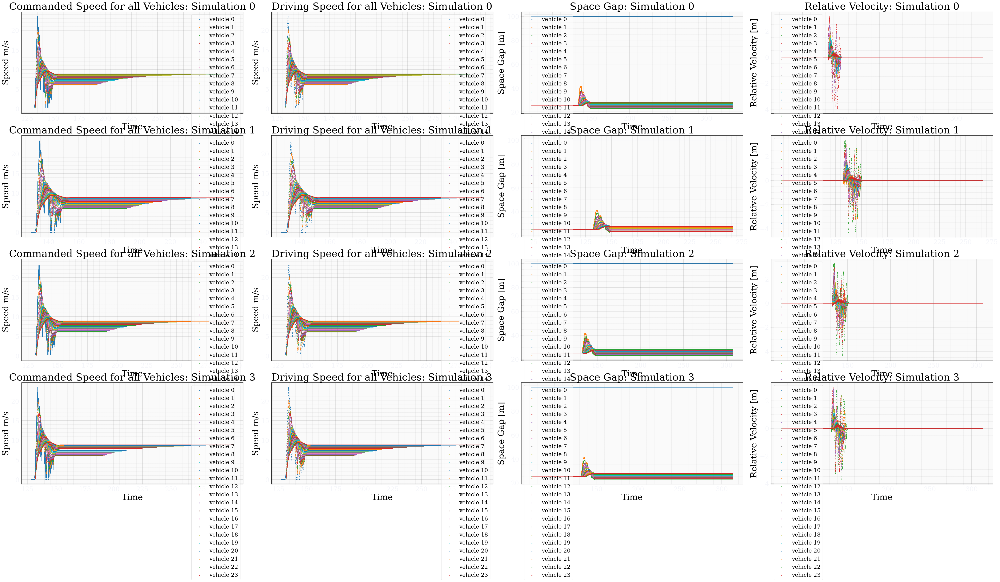

In [19]:
# Simulation 0 Data
%matplotlib inline

fig, ax = bagpy.create_fig(nrows = len(cmd_speed), ncols = 4 )
ax = ax.reshape(len(cmd_speed), 4 )
for j in range(0, len(cmd_speed)):
    
    cs = cmd_speed[j]
    s = speed[j]
    ld = lead_dist[j]
    rv = rel_vel[j]
    
    for i, v in enumerate(cs):
        ax[j, 0].scatter(x = 'Time', y = 'linear.x', data = cs[i], s = 1, label = 'vehicle {}'.format(i))
        ax[j, 0].legend()
        ax[j, 0].set_xlabel('Time')
        ax[j, 0].set_ylabel('Speed m/s')
        ax[j, 0].set_title('Commanded Speed for all Vehicles: Simulation {}'.format(j))

#     fig, ax = bagpy.create_fig(1)
    for i, v in enumerate(s):
        ax[j, 1].scatter(x = 'Time', y = 'linear.x', data = s[i], s = 1, label = 'vehicle {}'.format(i))
        ax[j, 1].legend()
        ax[j, 1].set_xlabel('Time')
        ax[j, 1].set_ylabel('Speed m/s')
        ax[j, 1].set_title('Driving Speed for all Vehicles: Simulation {}'.format(j))

#     fig, ax = bagpy.create_fig(1)
    for i, v in enumerate(ld):
        ax[j, 2].scatter(x = 'Time', y = 'data', data = ld[i], s = 1, label = 'vehicle {}'.format(i))
        ax[j, 2].legend()
        ax[j, 2].set_xlabel('Time')
        ax[j, 2].set_ylabel('Space Gap [m]')
        ax[j, 2].set_title('Space Gap: Simulation {}'.format(j))

#     fig, ax = bagpy.create_fig(1)
    for i, v in enumerate(rv):
        ax[j, 3].scatter(x = 'Time', y = 'linear.z', data = rv[i], s = 1, label = 'vehicle {}'.format(i))
        ax[j, 3].legend()
        ax[j, 3].set_xlabel('Time')
        ax[j, 3].set_ylabel('Relative Velocity [m]')
        ax[j, 3].set_title('Relative Velocity: Simulation {}'.format(j))
        
fig.show()

# Overlaid plot of same vehicle trajectory

[2021_10_11_12_56_15] (numexpr.utils) INFO: Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
[2021_10_11_12_56_15] (numexpr.utils) INFO: NumExpr defaulting to 8 threads.
[2021_10_11_12_56_16] (root) INFO: Zero pass correlation coefficient  = (0.988836565154745, 0.0)
[2021_10_11_12_56_16] (root) INFO: Zero pass correlation coefficient  = (0.99042979716701, 0.0)
[2021_10_11_12_56_16] (root) INFO: Zero pass correlation coefficient  = (0.9787532003347486, 0.0)
Vehicle: 0
Vehicle: 1
Vehicle: 2
Vehicle: 3
Vehicle: 4
Vehicle: 5
Vehicle: 6
Vehicle: 7
Vehicle: 8
Vehicle: 9
Vehicle: 10
Vehicle: 11
Vehicle: 12
Vehicle: 13
Vehicle: 14


/home/refulgent/anaconda3/envs/strym/lib/python3.7/site-packages/ipykernel_launcher.py:18: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



Vehicle: 15
Vehicle: 16
Vehicle: 17
Vehicle: 18
Vehicle: 19
Vehicle: 20
Vehicle: 21
Vehicle: 22
Vehicle: 23


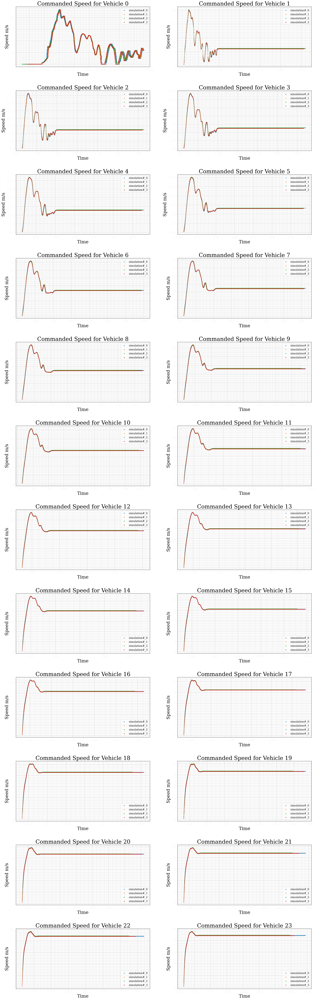

In [20]:
fig, ax = bagpy.create_fig(ncols = 2, nrows = 12)

p = [0]    
for k in range(1, len(cmd_speed)):
    p1 = strymread.time_shift(df1=cmd_speed[0][0], df2=cmd_speed[k][0], msg_col1 = 'linear.x', msg_col2='linear.x')
    p.append(p1)

for j in range(0, len(cmd_speed[0])):
    
    print('Vehicle: {}'.format(j))
    for k in range(0, len(cmd_speed)):
        ax[j].scatter(x = cmd_speed[k][j]['Time']  + p[k], y = cmd_speed[k][j]['linear.x'],  s = 2, label = 'simulation#_{}'.format(k))
    
    ax[j].legend()
    ax[j].set_xlabel('Time')
    ax[j].set_ylabel('Speed m/s')
    ax[j].set_title('Commanded Speed for Vehicle {}'.format(j))
    fig.show()

In [2]:
from sparkle import gzstats


In [3]:
folder = '/home/refulgent/Cyverse/sparkle/'
folder1 = folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-08-33-55/'

G1 = gzstats(statfile=folder1 + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-08-33-55_gzStats.txt')


In [4]:
G1.dataframe

,Factor,SimTime,RealTime,SimStatus
0,0.4,69.16,157.90,0.0
1,0.4,69.24,158.10,0.0
2,0.4,69.33,158.33,0.0
3,0.4,69.41,158.53,0.0
4,0.4,69.49,158.73,0.0
...,...,...,...,...
4330,0.4,333.96,819.82,0.0
4331,0.4,334.05,820.04,0.0
4332,0.4,334.14,820.27,0.0
4333,0.4,334.22,820.47,0.0


In [5]:
folder2 = folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-09-11-33/'
G2= gzstats(statfile=folder2 + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-09-11-33_gzStats.txt')
G2.dataframe

,Factor,SimTime,RealTime,SimStatus
0,0.4,69.67,158.57,0.0
1,0.4,69.76,158.79,0.0
2,0.4,69.84,158.99,0.0
3,0.4,69.93,159.22,0.0
4,0.4,70.01,159.42,0.0
...,...,...,...,...
3532,0.4,265.73,648.65,0.0
3533,0.4,265.82,648.87,0.0
3534,0.4,265.91,649.10,0.0
3535,0.4,266.00,649.32,0.0


In [6]:
folder3 = folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-09-32-41/'
G3 = gzstats(folder3 + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-09-32-41_gzStats.txt')
G3.dataframe

,Factor,SimTime,RealTime,SimStatus
0,0.4,69.55,158.44,0.0
1,0.4,69.64,158.66,0.0
2,0.4,69.72,158.86,0.0
3,0.4,69.80,159.06,0.0
4,0.4,69.89,159.29,0.0
...,...,...,...,...
4011,0.4,306.78,751.98,0.0
4012,0.4,306.87,752.21,0.0
4013,0.4,306.96,752.43,0.0
4014,0.4,307.05,752.66,0.0


In [7]:
folder4 = folder + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-10-00-27/'
G4 = gzstats(folder4 + 'sparkle_n_24_max_update_rate_40.0_time_step_0.01_recordtime_400.0_2021-10-11-10-00-27_gzStats.txt')
G4.dataframe

,Factor,SimTime,RealTime,SimStatus
0,0.4,69.48,158.18,0.0
1,0.4,69.56,158.38,0.0
2,0.4,69.64,158.58,0.0
3,0.4,69.72,158.78,0.0
4,0.4,69.81,159.01,0.0
...,...,...,...,...
4023,0.4,307.09,752.79,0.0
4024,0.4,307.17,752.99,0.0
4025,0.4,307.26,753.22,0.0
4026,0.4,307.35,753.44,0.0


/home/refulgent/anaconda3/envs/strym/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



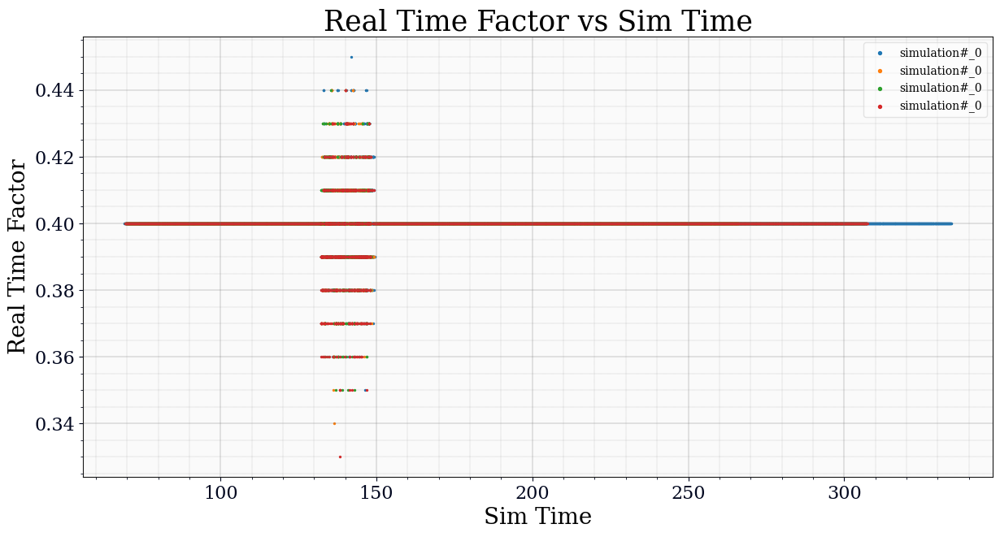

In [8]:
fig, ax = bagpy.create_fig(1)
ax[0].scatter(x = 'SimTime', y = 'Factor',  data=G1.dataframe, s = 2, label = 'simulation#_{}'.format(0))
ax[0].scatter(x = 'SimTime', y = 'Factor',  data=G2.dataframe, s = 2, label = 'simulation#_{}'.format(0))
ax[0].scatter(x = 'SimTime', y = 'Factor',  data=G3.dataframe, s = 2, label = 'simulation#_{}'.format(0))
ax[0].scatter(x = 'SimTime', y = 'Factor',  data=G4.dataframe, s = 2, label = 'simulation#_{}'.format(0))
ax[0].legend()
ax[0].set_xlabel('Sim Time')
ax[0].set_ylabel('Real Time Factor')
ax[0].set_title('Real Time Factor vs Sim Time')
fig.show()